<a href="https://colab.research.google.com/github/modaresimr/UnifiedAR/blob/master/ADL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [0]:
import numpy as np
import pandas as pd
import os
!pip install wget
import wget
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns;

import tensorflow as tf
import json
!pip install intervaltree
from intervaltree import IntervalTree


!pip install tensorflow-plot

from textwrap import wrap
import re
import itertools
import tfplot
import matplotlib
from sklearn.metrics import confusion_matrix



import plotly.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.figure_factory as ff
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))
wget.download('https://raw.githubusercontent.com/alim1369/pretty-print-confusion-matrix/master/confusion_matrix_pretty_print.py')
from confusion_matrix_pretty_print import pretty_plot_confusion_matrix

#Hyperparameters


In [0]:
def mySegmentation(w_history,buffer):
  return FixedTimeWindow(w_history,buffer, shift=pd.Timedelta(60, unit='s'), size=pd.Timedelta(300, unit='s') )

# Prepare dataset

## Download

In [0]:
def load():
  !mkdir dataset
  actfile="dataset/activities.csv"
  sensfile="dataset/sensor_events.csv"
  descfile="dataset/sensor_description.csv"
  # if not os.path.isfile(actfile) and os.path.isfile(sensfile):
  !rm $actfile $sensfile $descfile


  print('Beginning downloading files')

  activity_url = 'https://drive.google.com/uc?authuser=0&id=1cd_AQbHpK4LBHRyuAWQRP2nG4ilsfNMr&export=download'  
  wget.download(activity_url, actfile)  

  sensor_events_url = 'https://drive.google.com/uc?authuser=0&id=1n_ARZ90Ebo0VgS40RU-ycd_4tUhDdZs9&export=download'  
  wget.download(sensor_events_url, sensfile)  

  sensor_description_url = 'https://drive.google.com/uc?authuser=0&id=1QL7bdl8lRbyWdE5uSlMIS9LottgSvDja&export=download'  
  wget.download(sensor_description_url, descfile)  


  global sensor_events
  sensor_events = pd.read_csv(sensfile,)
  t=pd.to_datetime(sensor_events['time'],format='%Y-%m-%d %H:%M:%S')
  sensor_events.loc[:,'time']=t
  sensor_events = sensor_events.sort_values(['time'])
  sensor_events = sensor_events.reset_index()
  sensor_events = sensor_events.drop(columns=['index'])

  global activity_events
  activity_events = pd.read_csv(actfile,index_col='Id')
  
  activity_events = activity_events.sort_values(['StartTime','EndTime'])
  st=pd.to_datetime(activity_events['StartTime'],format='%Y-%m-%d %H:%M:%S')
  et=pd.to_datetime(activity_events['EndTime'],format='%Y-%m-%d %H:%M:%S')
  activity_events['StartTime']=st
  activity_events['EndTime']=et
  #activity_events['Interval']=pd.IntervalIndex.from_arrays(activity_events['StartTime'],activity_events['EndTime'],closed='both')
  activity_events['Duration']=et-st

  global sensor_desc
  global activities
  global activities_map_inverse
  global activities_map
  global sensor_desc_map
  global sensor_desc_map_inverse
  global sensor_id_map
  global sensor_id_map_inverse
  
  sensor_desc_map_inverse={}
  sensor_desc_map={}
  

  sensor_desc = pd.read_csv(descfile,index_col='ItemId')
  sensor_desc.ItemRange=sensor_desc.ItemRange.apply(lambda x: json.loads(x))
  for i,sd in sensor_desc[sensor_desc.Nominal==1].iterrows():
    sensor_desc_map_inverse[i]={k: v for v, k in enumerate(sd.ItemRange['range'])} 
    sensor_desc_map[i]={v: k for v, k in enumerate(sd.ItemRange['range'])} 
    
  
  sensor_events.value=sensor_events.apply(lambda x:x.value if not(x.SID in sensor_desc_map_inverse) else sensor_desc_map_inverse[x.SID][str(int(x.value))] if type(x.value) is float else sensor_desc_map_inverse[x.SID][x.value],axis=1)
  sensor_id_map={v: k for v, k in enumerate(sensor_desc.index)} 
  sensor_id_map_inverse={k: v for v, k in enumerate(sensor_desc.index)} 
    
  activities=activity_events['Activity'].unique()
  activities=np.insert(activities,0,'None')
  activities_map_inverse={k: v for v, k in enumerate(activities)}
  activities_map={v: k for v, k in enumerate(activities)}
  activity_events.Activity=activity_events.Activity.apply(lambda x:activities_map_inverse[x])
  global activity_events_tree
  activity_events_tree=IntervalTree()
  for i,act in activity_events.iterrows():
    activity_events_tree[act.StartTime.value:act.EndTime.value]=act  

load()


mkdir: cannot create directory ‘dataset’: File exists
Beginning downloading files


/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2828: DtypeWarning:

Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.



### View File contents

In [0]:
sensor_events.iloc[20:25]

,SID,time,value
20,132,2017-01-30 07:58:40,0
21,127,2017-01-30 07:58:40,0
22,113,2017-01-30 07:58:40,0
23,286,2017-01-30 07:58:41,0.354432
24,96,2017-01-30 07:58:44,179071


In [0]:
activity_events.loc[1:1]

,StartTime,EndTime,Activity,Duration
Id,,,,
1,2017-01-30 07:58:30,2017-01-30 08:01:44,1,00:03:14


In [0]:
sensor_desc.loc[300:300]

,ItemName,Cumulative,Nominal,OnChange,ItemRange,Location,Object,SensorName
ItemId,,,,,,,,
300,kitchen_cupboard1,0,1,1,"{'range': ['CLOSED', 'OPEN']}",kitchen,cupboard1,state


## DataSet Description

In [0]:
#print("Activites: ",activities)
for a,v in activities_map.items():
    items=activity_events.loc[activity_events['Activity']==a]['Duration']
    print (a,v,'\t--> count=',items.count(), ' avg duration=',str(items.mean()))
 

0 None 	--> count= 0  avg duration= NaT
1 Entrance|Entering 	--> count= 21  avg duration= 0 days 00:01:38.380952
2 Staircase|Going_up 	--> count= 57  avg duration= 0 days 00:00:20.245614
3 Bathroom|Showering 	--> count= 19  avg duration= 0 days 00:17:14.105263
4 Bathroom|Using_the_sink 	--> count= 38  avg duration= 0 days 00:03:03.368421
5 Staircase|Going_down 	--> count= 57  avg duration= 0 days 00:00:16.824561
6 Living_room|Watching_TV 	--> count= 18  avg duration= 0 days 00:27:17.166666
7 Toilet|Using_the_toilet 	--> count= 8  avg duration= 0 days 00:02:03.125000
8 Office|Computing 	--> count= 46  avg duration= 0 days 02:33:13.021739
9 Kitchen|Preparing 	--> count= 19  avg duration= 0 days 00:01:30.105263
10 Kitchen|Cooking 	--> count= 19  avg duration= 0 days 00:10:51.789473
11 Living_room|Eating 	--> count= 19  avg duration= 0 days 00:11:30.210526
12 Kitchen|Washing_the_dishes 	--> count= 19  avg duration= 0 days 00:05:39.631578
13 Living_room|Cleaning 	--> count= 19  avg duration

# DataSet Visualization 

Living_room|Watching_TV
count                        18
mean     0 days 00:27:17.166666
std      0 days 00:04:33.795383
min             0 days 00:15:18
25%      0 days 00:24:52.750000
50%             0 days 00:27:50
75%      0 days 00:30:25.250000
max             0 days 00:34:06
Name: Duration, dtype: object


<Figure size 432x288 with 0 Axes>

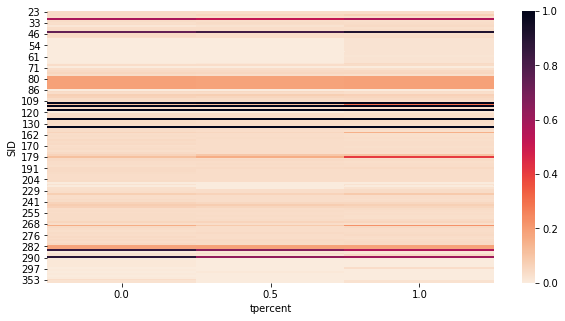

In [0]:
def view(i):

  tmp_act_evants=activity_events.loc[activity_events['Activity']==i]
  print(activities_map[i])
  print(tmp_act_evants['Duration'].describe())



  fig = plt.figure()

  tmp_act_evants['StartTime'].iloc[0]
  all=pd.DataFrame()
  for index, row in tmp_act_evants.iterrows():
    myse=sensor_events.loc[(sensor_events['time']>=row['StartTime']) & (sensor_events['time']<=row['EndTime'])].copy()
    myse['relative']=sensor_events['time']-row['StartTime']
    myse['tpercent']=myse['relative']/row['Duration']
    all=pd.concat([all,myse[['tpercent','SID']]])
    #plt.scatter(myse['tpercent'],myse['SID'])

  tmp=all.copy()

  tmp['tpercent']=(tmp['tpercent']*2).round(0)/2
  fig = plt.figure(figsize=(10,5))
  a=pd.pivot_table(tmp,columns='tpercent',index='SID',aggfunc=np.count_nonzero,fill_value=0)
  a=a/a.max();
  #plt.imshow(a, cmap='hot', interpolation='nearest')

  sns.heatmap(a/a.max(),cmap=sns.cm.rocket_r);
  global ali
  ali=tmp
view(6)

# Feature Extraction

In [0]:

def featureExtraction(window):
  f=np.zeros(sum(1 for x in sensor_id_map))  
  for i in range(0,window.shape[0]):
    f[sensor_id_map_inverse[window.iat[i,0]]]=1
    
    #f[sensor_id_map_inverse[x.SID]]=1
  return f
  

#print('test:',featureExtraction(sensor_events.iloc[1:10]))

#%timeit featureExtraction(es)

# Segmentation Abstract

In [0]:
class Buffer:
  def __init__(self, input, minsize,maxsize):
    self.data=input
    self.times=input.time.tolist()
    self.minsize =  minsize
    self.maxsize = maxsize
    self.start_index=0

  def removeTop(self, idx):
    self.start_index=idx
          
  def searchTime(self, time, operator=0):
    times=self.times;
    n=len(times);
    L = self.start_index
    R = n
    
    
    if operator ==1 :
      while L < R:
          m = int((L + R) / 2)

          if times[m] <= time:
              L = m + 1 
          else:
              R = m

      return L-1 if L>self.start_index else None
    else :
        while L < R:
          m = int((L + R) / 2)

          if times[m] < time:
              L = m + 1 
          else:
              R = m
        return L if L<n else None

In [0]:
 def segment(s_events): 
    buffer=Buffer(s_events,0,0)  
    w_history=[]; 
    while(1):
      window=mySegmentation(w_history,buffer)
      if window is None:
        return
      w_history.append(window)  
      yield window

# Segmentation Methods


##Fixed Time Window

In [0]:
def FixedTimeWindow(w_history,buffer,shift,size):
    
    if len(w_history)==0 :
      lastStart=pd.to_datetime(0) 
    else :
      lastStart=w_history[len(w_history)-1]['start']
    
    
    sindex=buffer.searchTime(lastStart+shift,-1)
    
    if(sindex is None):
      return None
    #try:
    stime=buffer.times[sindex]

    eindex=buffer.searchTime(stime+size,+1)
    etime=buffer.times[eindex]

    window=buffer.data.iloc[sindex:eindex+1];
    buffer.removeTop(sindex)

    return {'window':window,'start':stime, 'end':etime}
    #except:
    #  print(sindex, 'l',lastStart)
    


# Activity Fetcher

In [0]:
def activity(window):
  start=window.iat[0,1].value#.first.time
  end=window.iat[window.shape[0]-1,1].value
  acts=(activity_events_tree[start:end])

  if(len(acts)==0):
    return 0
  pacts=[]
  nacts=[]
  for x in acts:
    pacts.append((min(x.end,end)-max(x.begin,start))/(end-start))
    nacts.append(x.data)
  #np.argmax(pacts)
  return nacts[np.argmax(pacts)].Activity



#Train Test set maker

In [0]:
dataset_split=min(activity_events.StartTime)+((max(activity_events.EndTime)-min(activity_events.StartTime))/3*2)
train_s_events=sensor_events[sensor_events.time<dataset_split]
train_a_events=activity_events[activity_events.EndTime<dataset_split]

test_s_events=sensor_events[sensor_events.time>=dataset_split]
test_a_events=activity_events[activity_events.EndTime>=dataset_split]


train_generator=segment(train_s_events)
test_generator=segment(test_s_events)

train_set=[]
train_label=[]
train_set_window=[]
test_set=[]
test_label=[]
test_set_window=[]
i=0
for x in train_generator:
    if i % 10000 ==0:
       print (i)
    i+=1
    act=activity(x['window'])
    if (act == 8):
      continue 
    train_set_window.append(x)
    train_set.append(featureExtraction(x['window']))
    train_label.append(act)

for x in test_generator:
    if i % 10000 ==0:
       print (i)
    i+=1
    act=activity(x['window'])
    if (act == 8):
      continue 
    test_set_window.append(x)
    test_set.append(featureExtraction(x['window']))
    test_label.append(act)
    
    
train_set=np.array(train_set)
test_set=np.array(test_set)
train_label=np.array(train_label)
test_label=np.array(test_label)
train_set = np.reshape(train_set, (train_set.shape[0], 1, train_set.shape[1]))
test_set = np.reshape(test_set, (test_set.shape[0], 1,test_set.shape[1]))


0
10000


IndexError: ignored

#Model Builder

In [0]:
ftest=featureExtraction(sensor_events.iloc[0:1]);

model = tf.keras.models.Sequential([
  tf.keras.layers.Dense(32,input_shape=(1,ftest.size)),
  tf.keras.layers.LSTM(512, activation=tf.nn.relu),
  tf.keras.layers.Dense(512, activation=tf.nn.relu),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(activities.size, activation=tf.nn.softmax)
])
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(train_set, train_label, epochs=10)
model.evaluate(test_set, test_label)

Epoch 1/10
2307/2307 [==============================] - 4s 2ms/sample - loss: 2.0975 - acc: 0.2887
Epoch 2/10
2307/2307 [==============================] - 3s 1ms/sample - loss: 1.0450 - acc: 0.5977
Epoch 3/10
2307/2307 [==============================] - 3s 1ms/sample - loss: 0.8853 - acc: 0.6532
Epoch 4/10
2307/2307 [==============================] - 3s 1ms/sample - loss: 0.6788 - acc: 0.7187
Epoch 5/10
2307/2307 [==============================] - 3s 1ms/sample - loss: 0.6304 - acc: 0.7473
Epoch 6/10
2307/2307 [==============================] - 3s 1ms/sample - loss: 0.5987 - acc: 0.7477
Epoch 7/10
2307/2307 [==============================] - 3s 1ms/sample - loss: 0.5511 - acc: 0.7729
Epoch 8/10
2307/2307 [==============================] - 3s 1ms/sample - loss: 0.5005 - acc: 0.7932
Epoch 9/10
2307/2307 [==============================] - 3s 1ms/sample - loss: 0.4902 - acc: 0.7976
Epoch 10/10
1057/1057 [==============================] - 0s 330us/sample - loss: 1.5524 - acc: 0.7275


[1.5523551484068672, 0.7275307]

# Model Visualization

In [0]:
def plot_confusion_matrix(matrix,labels):
  import seaborn as sn
  import pandas as pd
  import matplotlib.pyplot as plt
    
  
  df_cm = pd.DataFrame(np.array(matrix).round(1), index = labels,
                  columns = labels)
  from confusion_matrix_pretty_print import pretty_plot_confusion_matrix
  
  #sn.heatmap(df_cm, annot=True)
  cmap = 'PuRd'
  
  pretty_plot_confusion_matrix(df_cm, cmap=cmap,figsize=[20,20])
  

p_label=model.predict_classes(test_set)
cm=confusion_matrix(test_label, p_label)

plot_confusion_matrix(cm,activities)


ValueError: ignored

# Real Accuracy

In [0]:
def plotAct(acts):
  firstacts=acts.iloc[0];
  for a in activities:
    acts=acts.append({'Activity':activities_map_inverse[a],'StartTime':firstacts['StartTime'],'EndTime':firstacts['StartTime']},ignore_index=True)
    
  acts=acts.sort_values(by='Activity')
  
  df2=acts.apply(lambda x:dict(Task=activities_map[x.Activity],Color=0, Start=x.StartTime, Finish=x.EndTime), axis=1).tolist()
  configure_plotly_browser_state()
  init_notebook_mode(connected=False)
  fig=ff.create_gantt(df2, index_col='Color', group_tasks=True)
  fig['layout'].update(margin=dict(l=150))
  iplot( fig)
#plotAct(activity_events)


In [0]:
testact=[]
testactp=[]
pacts=model.predict_classes(test_set)
for i in range(0,len(test_set_window)):
  #print(test_set_window[i])
  testact.append({'Activity':test_label[i],'StartTime':test_set_window[i]['start'],'EndTime':test_set_window[i]['end']})
  testactp.append({'Activity':pacts[i],'StartTime':test_set_window[i]['start'],'EndTime':test_set_window[i]['end']})
  



In [0]:
#plotAct(testact[1:1000])
plotAct(pd.DataFrame(testact[1:200]))
plotAct(pd.DataFrame(testactp[1:200]))


/content/confusion_matrix_pretty_print.py:144: RuntimeWarning:

invalid value encountered in double_scalars

/content/confusion_matrix_pretty_print.py:145: RuntimeWarning:

invalid value encountered in double_scalars



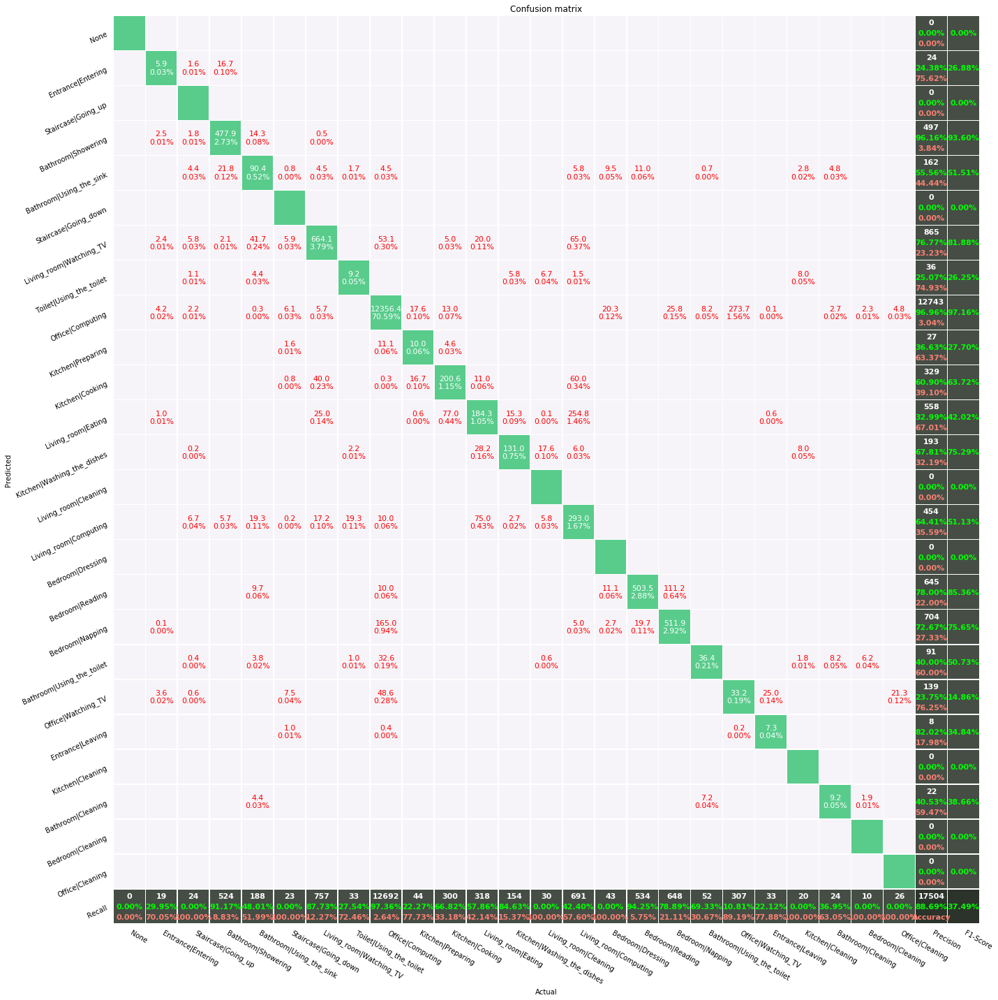

In [0]:
def makeIntervalTree(acts):
  tree=IntervalTree()
  for act in acts:
    
    start=act['StartTime'].value;
    end=act['EndTime'].value;
    if(start==end):
      start=start-1
    tree[start:end]=act  
  return tree


def findOverlap(a,b):
  
  return ((min(a['EndTime'],b['EndTime'])-max(a['StartTime'],b['StartTime'])).value)/pd.to_timedelta('60s').value


def myaccuracy(real,predicted):
  realtree=makeIntervalTree(real)
  predictedtree=makeIntervalTree(predicted)
  #predictedtree=makeIntervalTree(labels)
  
  
  timeconfusion_matrix=np.zeros((len(activities),len(activities)))
  
  for p in real:
    for q in predictedtree[p['StartTime'].value:p['EndTime'].value]:
      timeconfusion_matrix[p['Activity']][q.data['Activity']]+=findOverlap(p,q.data);
        
  #for p in predicted:
  #  for q in realtree[p['StartTime'].value:p['EndTime'].value]:
  #      timeconfusion_matrix[p['Activity']][q.data['Activity']]+=findOverlap(p,q.data);
        
  return timeconfusion_matrix

test_a_events_arr=[x for i,x in test_a_events.iterrows() ]
matrix=myaccuracy(test_a_events_arr,testactp)
#pd.DataFrame(matrix)
plot_confusion_matrix(matrix,activities)

# Model2

In [0]:
newTrainItems=model.predict_classes(train_set)
newTestItems=model.predict_classes(test_set)


In [0]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

#pad_sequences(train_set[0])
x=np.array(train_set[0])
print(x)
y=pad_sequences(train_set, maxlen=1000, padding='post')
y[0]

[175  51  49 173 171  59 169  55 163 202 165 167  48 116 116 116 116 116
  51  49  59  55  48 110  46  56  15 137 110  48  55 175 169 163 165 171
 173  59 167  51  49 138  84  83 138 203 137 115 134 116 110 134 115 110
   4 116 115  59  51  49  48  55  16  17 116  49  48  51  59  55 116 165
 163 167 169 175 171 173  96 116 102 108  51  48  77  55  49  76  59 116
   9  66  88 115 110  98 115 116 110 187 187 121 119 122 231 129 123 171
 173 208 175 169 116  51 110  48 167 165  55 163  59  49 115  64 115  93
 214   6 199 204 106  55  51  49  64  59  48  54 102  63   0 116 211 102
  37 167 173 171 169 165 175 163  48  55 122 119 121  51 123  59  49 108
  64  43  93  10  68  44  62   7  58 102  59  51  55  48  49 110  16  17
 116  45  74  38  13  40 163 167 169 173 175 165 171  59  49  51  55  48
 116  64 129  80  79  71  53  47  12  45 102  51  59  49  48 116  55 102
  81  73 171 165 175 169 173 167 163  48  51  59  49  55 125  41  42   1
  18  59  51  48  22  49  55 215 230 101  37 173 16

array([175,  51,  49, 173, 171,  59, 169,  55, 163, 202, 165, 167,  48,
       116, 116, 116, 116, 116,  51,  49,  59,  55,  48, 110,  46,  56,
        15, 137, 110,  48,  55, 175, 169, 163, 165, 171, 173,  59, 167,
        51,  49, 138,  84,  83, 138, 203, 137, 115, 134, 116, 110, 134,
       115, 110,   4, 116, 115,  59,  51,  49,  48,  55,  16,  17, 116,
        49,  48,  51,  59,  55, 116, 165, 163, 167, 169, 175, 171, 173,
        96, 116, 102, 108,  51,  48,  77,  55,  49,  76,  59, 116,   9,
        66,  88, 115, 110,  98, 115, 116, 110, 187, 187, 121, 119, 122,
       231, 129, 123, 171, 173, 208, 175, 169, 116,  51, 110,  48, 167,
       165,  55, 163,  59,  49, 115,  64, 115,  93, 214,   6, 199, 204,
       106,  55,  51,  49,  64,  59,  48,  54, 102,  63,   0, 116, 211,
       102,  37, 167, 173, 171, 169, 165, 175, 163,  48,  55, 122, 119,
       121,  51, 123,  59,  49, 108,  64,  43,  93,  10,  68,  44,  62,
         7,  58, 102,  59,  51,  55,  48,  49, 110,  16,  17, 11

In [0]:
def featureExtraction(window):
  #f=np.zeros(sum(1 for x in sensor_id_map))  
  f=[]
  for i in range(0,window.shape[0]):
    f.append(sensor_id_map_inverse[window.iat[i,0]])
    
    #f[sensor_id_map_inverse[x.SID]]=1
  return f
  

#print('test:',featureExtraction(sensor_events.iloc[1:40]))

#%timeit featureExtraction(es)

In [0]:
def embed_model(input_shape, input_size, output_size):
    """
    Build and train a RNN model using word embedding on x and y
    :param input_shape: Tuple of input shape
    :param output_sequence_length: Length of output sequence
    :param english_vocab_size: Number of unique English words in the dataset
    :param french_vocab_size: Number of unique French words in the dataset
    :return: Keras model built, but not trained
    """
    # TODO: Implement

    # Hyperparameters
    learning_rate = 0.005
    
    # TODO: Build the layers
    model = tf.keras.models.Sequential()
    #model.add(tf.keras.layers.Embedding(input_size+1, 5,input_shape=(1,256),input_length=1))
    model.add(tf.keras.layers.GRU(256, return_sequences=True,input_shape=(1,256)) )   
    model.add(tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(256, return_sequences=True)))    
    model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(64, activation='relu')))
    model.add(tf.keras.layers.Dropout(0.5))
    model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(output_size+1, activation='softmax'))) 
    

    # Compile model
    model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
    return model




# TODO: Train the neural network
embed_rnn_model = embed_model(
    train_set.shape,
    len(sensor_desc_map)+1,
    len(activities)+1)

embed_rnn_model.summary()

ts=pad_sequences(train_set, maxlen=256, padding='post')
ts = np.reshape(ts, (ts.shape[0], 1, ts.shape[1]))


embed_rnn_model.fit(ts, train_label, batch_size=1, epochs=3, validation_split=0.2)

# TODO: Print prediction(s)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_1 (GRU)                  (None, 1, 256)            393984    
_________________________________________________________________
bidirectional_2 (Bidirection (None, 1, 512)            1050624   
_________________________________________________________________
time_distributed_4 (TimeDist (None, 1, 64)             32832     
_________________________________________________________________
dropout_2 (Dropout)          (None, 1, 64)             0         
_________________________________________________________________
time_distributed_5 (TimeDist (None, 1, 27)             1755      
Total params: 1,479,195
Trainable params: 1,479,195
Non-trainable params: 0
_________________________________________________________________
Train on 1845 samples, validate on 462 samples
Epoch 1/3
 448/1845 [======>.......................] - ETA: 1:11 - loss: 2.8307 - acc

KeyboardInterrupt: ignored

In [0]:
tts=pad_sequences(test_set, maxlen=256, padding='post')
tts = np.reshape(tts, (tts.shape[0], 1,tts.shape[1]))
#embed_rnn_model.evaluate(tts,test_label)
embed_rnn_model.predict_classes(np.reshape(tts[0],(1,1,tts[0].shape[1])))

In [0]:
model2 = tf.keras.Sequential([
    tf.keras.layers.Dense(32,input_shape=(1,ftest.size)),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(
        64, return_sequences=True)),
    #tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(activities.size, activation=tf.nn.softmax)
])

model2.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model2.fit(train_set, train_label, epochs=10)
model2.evaluate(test_set, test_label)

In [0]:
test_set2=test_set
model2.evaluate(test_set, test_label)

In [0]:
p_label=model2.predict_classes(test_set);
plot_confusion_matrix(test_label, p_label,labels=activities, tensor_name='dev/cm')

In [0]:
!ls
import shutil
shutil.make_archive("savedmodel2", 'zip', ".")
from google.colab import files
files.download('savedmodel.zip')


'confusion_matrix_pretty_print (1).py'	 __pycache__    savedmodel.zip
 confusion_matrix_pretty_print.py	 sample_data
 dataset				 saved_models


----------------------------------------
Exception happened during processing of request from ('::ffff:127.0.0.1', 40596, 0, 0)
Traceback (most recent call last):
  File "/usr/lib/python3.6/socketserver.py", line 317, in _handle_request_noblock
    self.process_request(request, client_address)
  File "/usr/lib/python3.6/socketserver.py", line 348, in process_request
    self.finish_request(request, client_address)
  File "/usr/lib/python3.6/socketserver.py", line 361, in finish_request
    self.RequestHandlerClass(request, client_address, self)
  File "/usr/lib/python3.6/socketserver.py", line 721, in __init__
    self.handle()
  File "/usr/lib/python3.6/http/server.py", line 418, in handle
    self.handle_one_request()
  File "/usr/lib/python3.6/http/server.py", line 406, in handle_one_request
    method()
  File "/usr/lib/python3.6/http/server.py", line 639, in do_GET
    self.copyfile(f, self.wfile)
  File "/usr/lib/python3.6/http/server.py", line 800, in copyfile
    shutil.copyfil

In [0]:
!rm -r saved_models